# Flower Type Recognition using Convolutional Neural Networks (CNN)

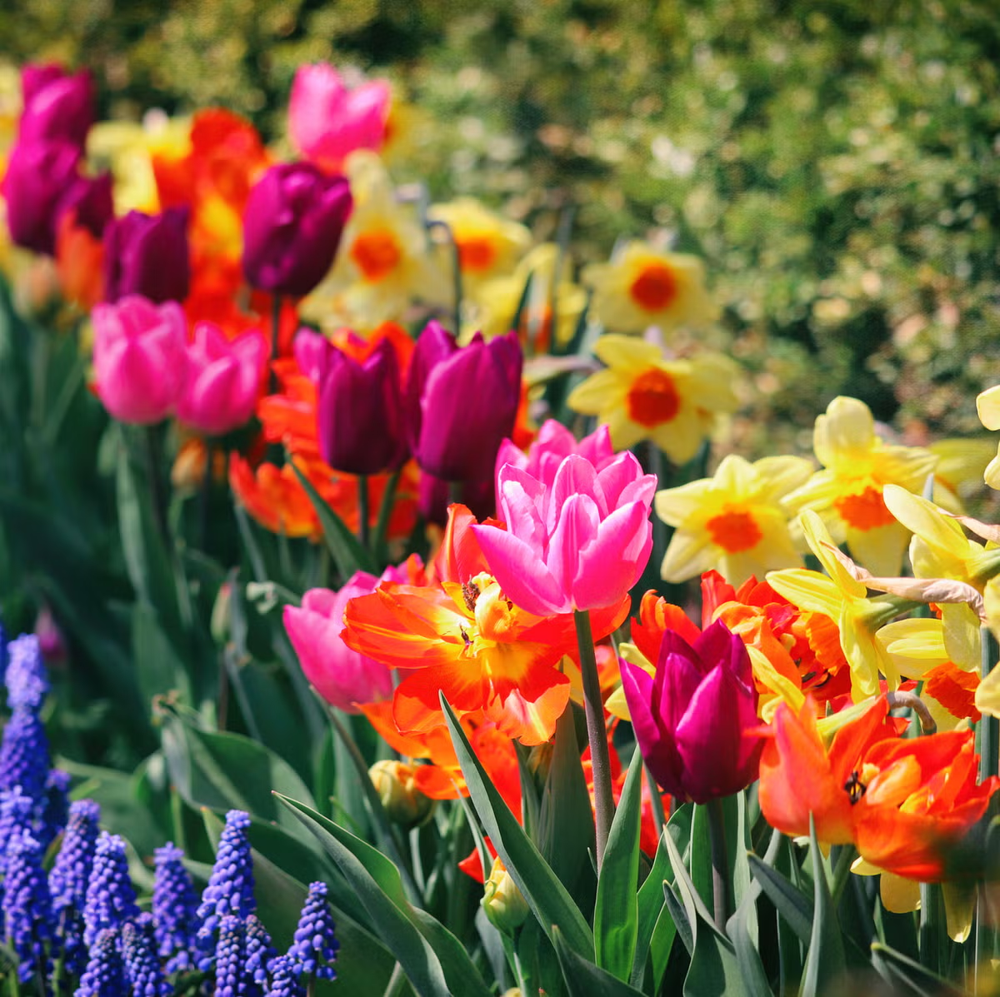
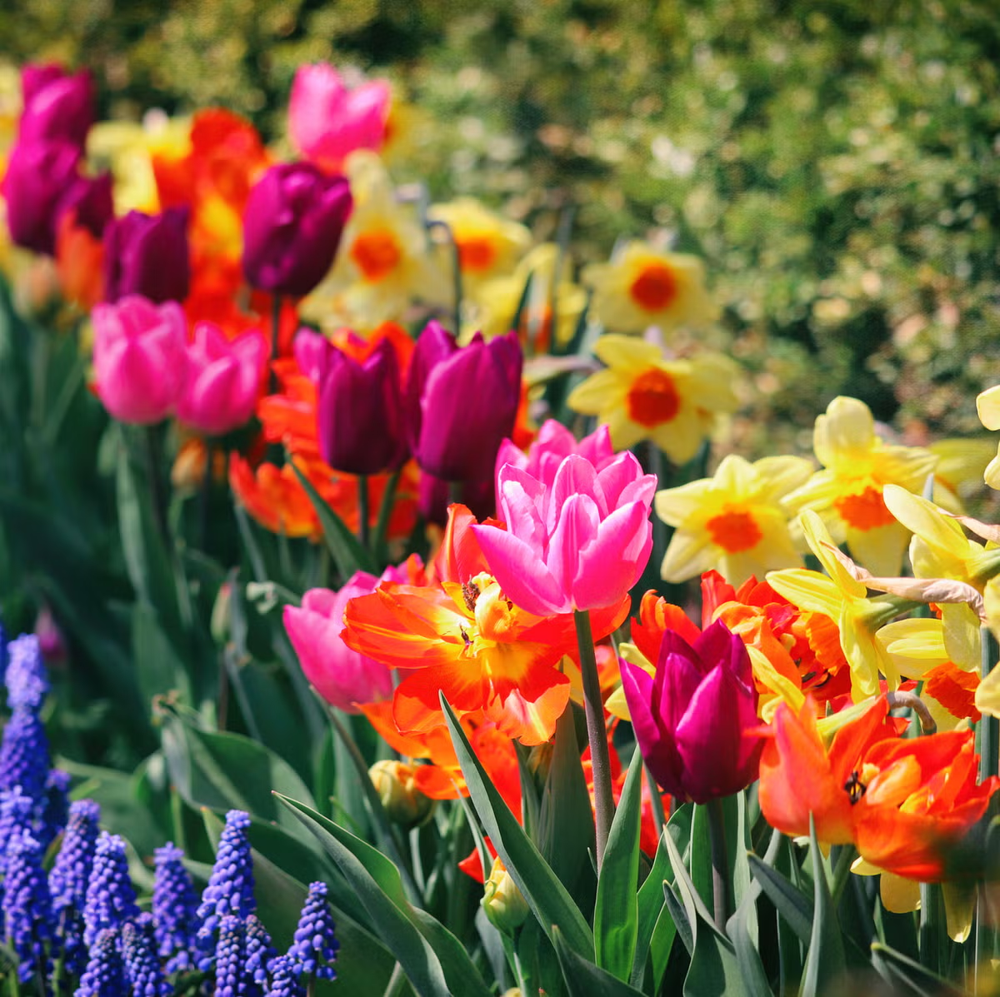

## Overview

The goal of this project is to develop a machine learning model capable of recognizing different flower types from images. The model uses Convolutional Neural Networks (CNN), a deep learning architecture that excels in image classification tasks. The dataset contains images of five different flower types: **dandelion**, **daisy**, **sunflower**, **tulip**, and **rose**. The CNN model is trained to classify these flowers based on the patterns and features extracted from the images.

## Dataset

The dataset used in this project consists of images from five flower categories:
- **Dandelion**
- **Daisy**
- **Sunflower**
- **Tulip**
- **Rose**

Each image is preprocessed to a consistent size and normalized to ensure the model performs efficiently.

## Model Architecture

The model is a Convolutional Neural Network (CNN), which is a powerful architecture commonly used for image recognition tasks. The network is designed with multiple convolutional layers, activation functions, max-pooling, and dropout layers to capture relevant features and avoid overfitting. The output layer is a softmax classifier that predicts one of the five flower categories.

## Objective

The objective of this project is to build a CNN model that can accurately classify images of flowers into one of the five categories. The model aims to achieve high classification accuracy and demonstrate the effectiveness of deep learning in solving image classification tasks.

## Requirements

In [50]:
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import cifar10
import cv2
import pandas as pd
import os 
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, Input, MaxPooling2D,Dropout,BatchNormalization,Reshape
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, Input, MaxPooling2D,Dropout,BatchNormalization,Reshape
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics import accuracy_score
import math
from tensorflow.keras.models import load_model

## Import Data

In [51]:
image_path="/kaggle/input/flowers/flowers/"
os.listdir(image_path)

['dandelion', 'daisy', 'sunflower', 'tulip', 'rose']

In [52]:
labels=['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

In [53]:
img_list=[]
label_list=[]
for label in labels:
    for img in os.listdir(image_path+label):
        img_list.append(image_path+label+"/"+img)
        label_list.append(label)

## EDA (Exploratory Data Analysis)

In [54]:
df=pd.DataFrame({"img":img_list,"label":label_list})
df.sample(5)

,img,label
1854,/kaggle/input/flowers/flowers/rose/2141413229_...,rose
1544,/kaggle/input/flowers/flowers/dandelion/698310...,dandelion
2716,/kaggle/input/flowers/flowers/sunflower/368387...,sunflower
3471,/kaggle/input/flowers/flowers/tulip/2834890466...,tulip
3828,/kaggle/input/flowers/flowers/tulip/3511104954...,tulip


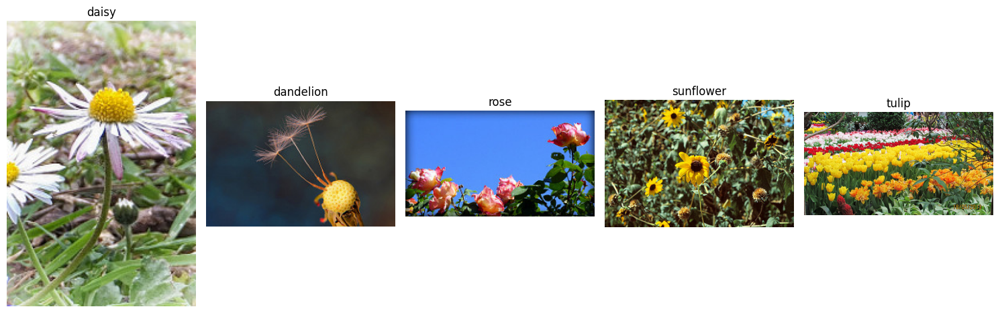

In [55]:
plt.figure(figsize=(15, 5))

for i, label in enumerate(labels):
    sample_img_path = df[df['label'] == label].iloc[0]['img'] 
    img = cv2.imread(sample_img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    
    plt.subplot(1, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(label)

plt.tight_layout()
plt.show()

In [56]:
df.shape

(4317, 2)

In [57]:
label_encoding_dict={"daisy":0,"dandelion":1,"rose":2,"sunflower":3,"tulip":4}
df["label_encoding"]=df["label"].map(label_encoding_dict)

In [58]:
df["label"].value_counts()

label
dandelion    1052
tulip         984
rose          784
daisy         764
sunflower     733
Name: count, dtype: int64

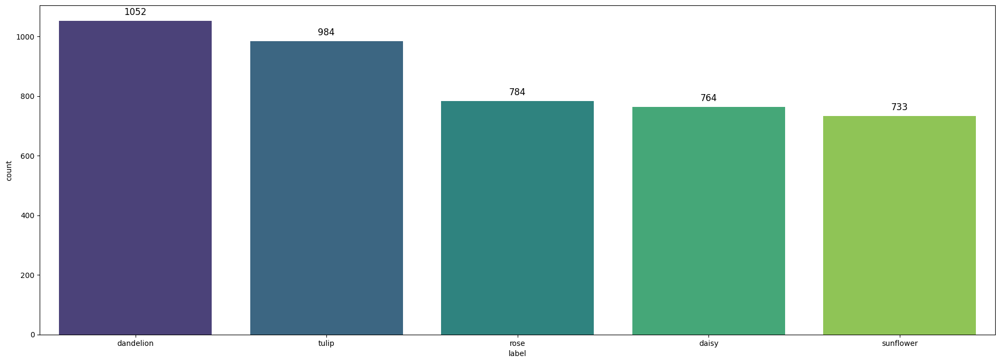

In [59]:
plt.figure(figsize=(23,8))
ax=sns.countplot(x=df["label"],palette="viridis",order=df['label'].value_counts().index)
for p in ax.containers:
    ax.bar_label(p, fontsize=12, color='black', padding=5);

## Preprocess Images

In [60]:
x=[]
for img in df["img"]:
    img=cv2.imread(img)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img=cv2.resize(img,(64,64))
    img=img/255.0
    x.append(img)

In [61]:
x=np.array(x)

In [62]:
y=df[["label_encoding"]]

In [63]:
x.shape,y.shape

((4317, 64, 64, 3), (4317, 1))

## Image Augmentation

In [64]:
from imblearn.over_sampling import SMOTE
x_flat = x.reshape(x.shape[0], -1)  
y_flat = y['label_encoding'].values 
smote = SMOTE(random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_flat, y_flat)
x_resampled_images = x_resampled.reshape(-1, 64,64, 3)

In [65]:
x_resampled_images.shape,y_resampled.shape

((5260, 64, 64, 3), (5260,))

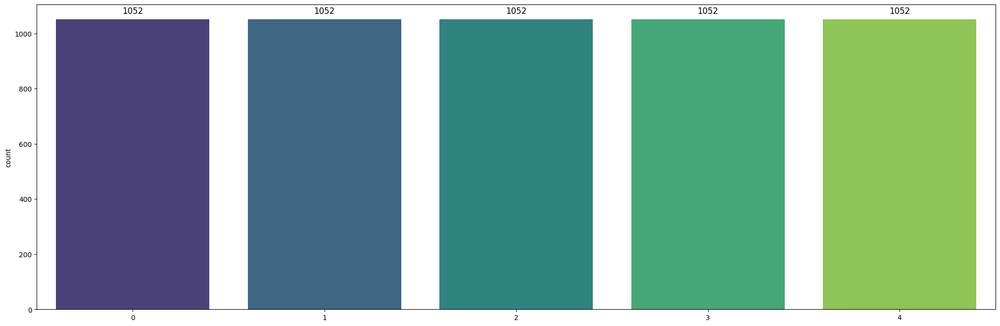

In [66]:
plt.figure(figsize=(25,8))
y_resampled_series=pd.Series(y_resampled)
ax=sns.countplot(x=y_resampled_series,palette="viridis")
for p in ax.containers:
    ax.bar_label(p,fontsize=12,color="black",padding=5);

## Modelling

In [67]:
x_train,x_test,y_train,y_test=train_test_split(x_resampled_images,y_resampled,test_size=.2,random_state=42)

In [68]:
model=Sequential()
model.add(Input(shape=(64,64,3)))
model.add(Conv2D(64,kernel_size=(3,3),activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(128,kernel_size=(3,3),activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(256,kernel_size=(3,3),activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(512,kernel_size=(3,3),activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(1024,kernel_size=(3,3),activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))



model.add(Flatten())

model.add(Dense(1024,activation='relu'))
model.add(Dense(512,activation='relu'))
model.add(Dense(256,activation='relu'))
model.add(Dense(128,activation='relu'))

model.add(Dropout(0.5))
model.add(Dense(5,activation='softmax'))

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [77]:
history=model.fit(x_train,y_train,validation_data=(x_test,y_test),epochs=70,batch_size=36,verbose=0)

In [78]:
model.save('cnn_model.h5')

## Model Analysis

In [79]:
history.history['accuracy'][-1]

0.9914448857307434

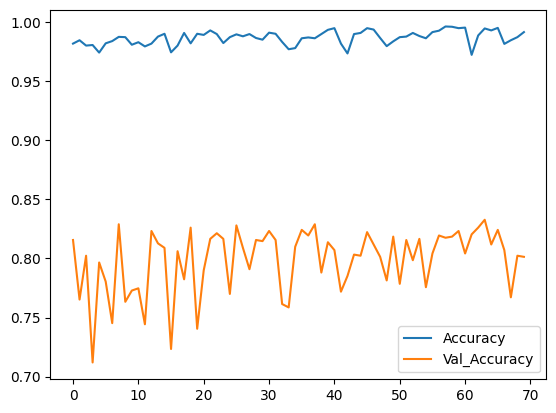

In [80]:
plt.plot(history.history['accuracy'],label='Accuracy')
plt.plot(history.history['val_accuracy'],label='Val_Accuracy')
plt.legend();

## Testing the Model

In [81]:
predictions=model.predict(x_test)
predictions=predictions.argmax(axis=-1)
predictions=np.array(predictions)

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


In [82]:
accuracy_score(predictions,y_test)

0.8013307984790875

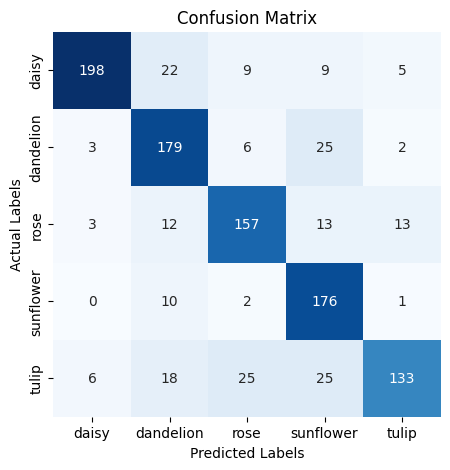

In [84]:
cm = confusion_matrix(y_test, predictions)  

plt.figure(figsize=(5, 5))
sns.heatmap(
    cm,
    annot=True,
    fmt='g',
    cmap='Blues',
    xticklabels=label_encoding_dict.keys(),
    yticklabels=label_encoding_dict.keys(),
    cbar=False
)
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.title('Confusion Matrix');

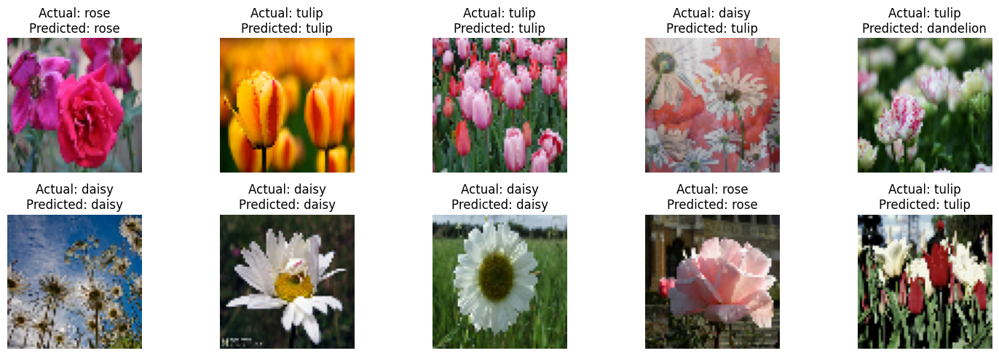

In [76]:
label_decoding_dict = {v: k for k, v in label_encoding_dict.items()}

y_sample_true_names = [label_decoding_dict[label] for label in y_sample_true]
y_sample_pred_names = [label_decoding_dict[label] for label in y_sample_pred]

plt.figure(figsize=(15, 5))
for i in range(num_samples):
    plt.subplot(2, 5, i + 1)
    plt.imshow(x_sample[i])
    plt.axis('off')
    plt.title(f"Actual: {y_sample_true_names[i]}\nPredicted: {y_sample_pred_names[i]}")

plt.tight_layout()
plt.show()

## Results

The model achieved an accuracy of **80.13%** on the test dataset, indicating a good overall performance in classifying the five flower types. The confusion matrix shown below visualizes the performance of the model across different classes:


### Analysis of the Confusion Matrix:

- **Daisy**: The model correctly classified 198 daisy images, but there were some misclassifications, especially with the dandelion and sunflower categories, which had 22 and 9 misclassifications, respectively.
- **Dandelion**: The dandelion class performed well with 179 correct predictions, but some misclassifications occurred with daisy (3) and rose (12).
- **Rose**: The model performed decently with 157 correct predictions for rose, although there were some misclassifications with other flower types like tulip (18) and sunflower (13).
- **Sunflower**: The sunflower class showed strong performance, with only 10 misclassified as dandelion and a few misclassifications to other categories.
- **Tulip**: The tulip class showed a fair performance with 133 correct predictions, though there were several misclassifications, particularly with sunflower and rose.

In summary, while the model performs well with an accuracy of over 80%, there are still areas for improvement in reducing misclassifications between similar flower types, especially for tulip and sunflower.